In [1]:
# essentials
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os 
import re
import string
from collections import Counter
import pickle

# NLP
import gensim
from gensim.models import Word2Vec

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

import tensorflow as tf
import tensorflow.keras
from keras.models import Sequential
from keras.layers import Dense, Input, Dropout
from keras.utils import to_categorical

# train test split 
from sklearn.model_selection import train_test_split

import config

In [2]:
small_data = True
seed = 42

In [4]:
# training parameters
epochs = 64
batch_size = 128
lr = 1e-4

## Load the data

In [5]:
if small_data:
    data_path = "data/reviews_cleaned_sample.csv"
else:
    data_path = "data/reviews_cleaned.csv"

reviews_df = pd.read_csv(data_path, converters={'tokenized': pd.eval})

### Generating vocabulary

In [6]:
nltk.download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [7]:
all_words = []

for tokenized_reviews in reviews_df.tokenized:
    all_words.extend(tokenized_reviews)

In [8]:
vocabulary = [word for word, quantity in Counter(all_words).items() if quantity >= config.MIN_COUNT]
vocabulary.append(config.END_TOKEN)

In [9]:
vocabulary_size = len(vocabulary)
vocabulary_size

5500

In [10]:
with open("./vocabularies/vocabulary_small.pkl", 'wb') as file:
    pickle.dump(vocabulary, file)

### Filtering tokens

In [11]:
# function to which filter token basing on the vocabulary

def filter_tokens(tokens, remove_stopwords=False):
    # removing rarely occurring words (< min_count)
    tokens = [token for token in tokens if token in vocabulary]

    if remove_stopwords:
        tokens = [token for token in tokens if token not in stop_words]

    # and adding [END] of document token at the end  
    tokens.append(config.END_TOKEN)

    return tokens

In [12]:
reviews_df["filter_tokens"] = reviews_df.tokenized.apply(filter_tokens)

In [13]:
reviews_df

,review,positive,preprocessed,tokenized,filter_tokens
0,Story of a man who has unnatural feelings for ...,False,story of a man who has unnatural feelings for ...,"[story, of, a, man, who, has, unnatural, feeli...","[story, of, a, man, who, has, feelings, for, a..."
1,Airport '77 starts as a brand new luxury 747 p...,False,airport starts as a brand new luxury plane i...,"[airport, starts, as, a, brand, new, luxury, p...","[airport, starts, as, a, brand, new, luxury, p..."
2,This film lacked something I couldn't put my f...,False,this film lacked something i couldnt put my fi...,"[this, film, lacked, something, i, couldnt, pu...","[this, film, lacked, something, i, couldnt, pu..."
3,"Sorry everyone,,, I know this is supposed to b...",False,"sorry everyone,,, i know this is supposed to b...","[sorry, everyone, ,, ,, ,, i, know, this, is, ...","[sorry, everyone, ,, ,, ,, i, know, this, is, ..."
4,When I was little my parents took me along to ...,False,when i was little my parents took me along to ...,"[when, i, was, little, my, parents, took, me, ...","[when, i, was, little, my, parents, took, me, ..."
...,...,...,...,...,...
495,B movie at best. Sound effects are pretty good...,False,"b movie at best, sound effects are pretty good...","[b, movie, at, best, ,, sound, effects, are, p...","[b, movie, at, best, ,, sound, effects, are, p..."
496,I chose to see this movie because it got a goo...,False,i chose to see this movie because it got a goo...,"[i, chose, to, see, this, movie, because, it, ...","[i, chose, to, see, this, movie, because, it, ..."
497,"Oh Dear Lord, How on Earth was any part of thi...",False,"oh dear lord, how on earth was any part of thi...","[oh, dear, lord, ,, how, on, earth, was, any, ...","[oh, dear, lord, ,, how, on, earth, was, any, ..."
498,This is not a film you can really analyse sepa...,False,this is not a film you can really analyse sepa...,"[this, is, not, a, film, you, can, really, ana...","[this, is, not, a, film, you, can, really, sep..."


## Word embedding

In [14]:
word2vec = Word2Vec(reviews_df.filter_tokens, min_count=config.MIN_COUNT, window=config.WINDOW, vector_size=config.VECTOR_SIZE)

In [15]:
word2vec.wv.vector_size

10

In [19]:
with open("models/word2vecs/the_smallest.pkl", 'wb') as file:
    pickle.dump(word2vec, file)

In [18]:
X_words = []
y_words = []

for tokenized_review in reviews_df.filter_tokens:
    # iterating over indices for the first which has enough words before (previous_words_considered)
    # until the last one
    for index in range(config.PREVIOUS_WORDS_CONSIDERED, len(tokenized_review)): 
        x = tokenized_review[index-config.PREVIOUS_WORDS_CONSIDERED: index]
        y = tokenized_review[index]

        print(x, y)
        X_words.append(tokenized_review[index-config.PREVIOUS_WORDS_CONSIDERED: index])
        y_words.append(tokenized_review[index])

['story', 'of', 'a'] man
['of', 'a', 'man'] who
['a', 'man', 'who'] has
['man', 'who', 'has'] feelings
['who', 'has', 'feelings'] for
['has', 'feelings', 'for'] a
['feelings', 'for', 'a'] ,
['for', 'a', ','] starts
['a', ',', 'starts'] out
[',', 'starts', 'out'] with
['starts', 'out', 'with'] a
['out', 'with', 'a'] opening
['with', 'a', 'opening'] scene
['a', 'opening', 'scene'] that
['opening', 'scene', 'that'] is
['scene', 'that', 'is'] a
['that', 'is', 'a'] terrific
['is', 'a', 'terrific'] example
['a', 'terrific', 'example'] of
['terrific', 'example', 'of'] absurd
['example', 'of', 'absurd'] comedy
['of', 'absurd', 'comedy'] ,
['absurd', 'comedy', ','] a
['comedy', ',', 'a'] audience
[',', 'a', 'audience'] is
['a', 'audience', 'is'] turned
['audience', 'is', 'turned'] into
['is', 'turned', 'into'] an
['turned', 'into', 'an'] insane
['into', 'an', 'insane'] ,
['an', 'insane', ','] violent
['insane', ',', 'violent'] by
[',', 'violent', 'by'] the
['violent', 'by', 'the'] crazy
['by', 

In [131]:
len(X_words)

117522

In [132]:
label_to_index = {word: index for index, word in enumerate(vocabulary)}

In [133]:
input_size = config.PREVIOUS_WORDS_CONSIDERED * config.VECTOR_SIZE

X = np.zeros((len(X_words), input_size))
y = np.zeros((len(X_words), vocabulary_size))

for index, x in enumerate(X_words):
    numpy_x = np.array([])
    for word in x:
        numpy_x = np.append(numpy_x, word2vec.wv.get_vector(word))

    X[index, ...]  = numpy_x

for index, label in enumerate(y_words):
    y[index, ...] = to_categorical(label_to_index[label], num_classes=vocabulary_size)

['story', 'of', 'a']
['of', 'a', 'man']
['a', 'man', 'who']
['man', 'who', 'has']
['who', 'has', 'feelings']
['has', 'feelings', 'for']
['feelings', 'for', 'a']
['for', 'a', ',']
['a', ',', 'starts']
[',', 'starts', 'out']
['starts', 'out', 'with']
['out', 'with', 'a']
['with', 'a', 'opening']
['a', 'opening', 'scene']
['opening', 'scene', 'that']
['scene', 'that', 'is']
['that', 'is', 'a']
['is', 'a', 'terrific']
['a', 'terrific', 'example']
['terrific', 'example', 'of']
['example', 'of', 'absurd']
['of', 'absurd', 'comedy']
['absurd', 'comedy', ',']
['comedy', ',', 'a']
[',', 'a', 'audience']
['a', 'audience', 'is']
['audience', 'is', 'turned']
['is', 'turned', 'into']
['turned', 'into', 'an']
['into', 'an', 'insane']
['an', 'insane', ',']
['insane', ',', 'violent']
[',', 'violent', 'by']
['violent', 'by', 'the']
['by', 'the', 'crazy']
['the', 'crazy', 'of']
['crazy', 'of', 'its']
['of', 'its', ',']
['its', ',', 'unfortunately']
[',', 'unfortunately', 'it']
['unfortunately', 'it', 's

In [138]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=True, random_state=seed)

In [139]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((105769, 30), (11753, 30), (105769, 5500), (11753, 5500))

In [140]:
model = Sequential()

model.add(Input(input_size))
model.add(Dense(64, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(128, activation="relu"))

model.add(Dense(vocabulary_size, activation="sigmoid"))

model.build()

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                1984      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 128)               8320      
                                                                 
 dense_2 (Dense)             (None, 5500)              709500    
                                                                 
Total params: 719,804
Trainable params: 719,804
Non-trainable params: 0
_________________________________________________________________


In [148]:
loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing=config.LABEL_SMOOTHING_RATIO)
optimizer = tf.keras.optimizers.Adam(learning_rate=config.LEARNING_RATE)

In [149]:
model.compile(loss=loss, optimizer=optimizer, metrics=["acc"])

In [150]:
training = model.fit(X_train, y_train, validation_split=0.1, batch_size=config.BATCH_SIZE, epochs=config.EPOCHS)

Epoch 1/64
744/744 [==============================] - 17s 20ms/step - loss: 6.2282 - acc: 0.1103 - val_loss: 6.3086 - val_acc: 0.1217
Epoch 2/64
744/744 [==============================] - 18s 24ms/step - loss: 6.1303 - acc: 0.1133 - val_loss: 6.2746 - val_acc: 0.1222
Epoch 3/64
744/744 [==============================] - 17s 23ms/step - loss: 6.0871 - acc: 0.1162 - val_loss: 6.2257 - val_acc: 0.1231
Epoch 4/64
744/744 [==============================] - 15s 20ms/step - loss: 6.0492 - acc: 0.1187 - val_loss: 6.1936 - val_acc: 0.1230
Epoch 5/64
744/744 [==============================] - 15s 20ms/step - loss: 6.0177 - acc: 0.1204 - val_loss: 6.1697 - val_acc: 0.1243
Epoch 6/64
744/744 [==============================] - 15s 20ms/step - loss: 5.9873 - acc: 0.1215 - val_loss: 6.1454 - val_acc: 0.1246
Epoch 7/64
744/744 [==============================] - 15s 20ms/step - loss: 5.9615 - acc: 0.1222 - val_loss: 6.1276 - val_acc: 0.1266
Epoch 8/64
744/744 [==============================] - 15s 20ms

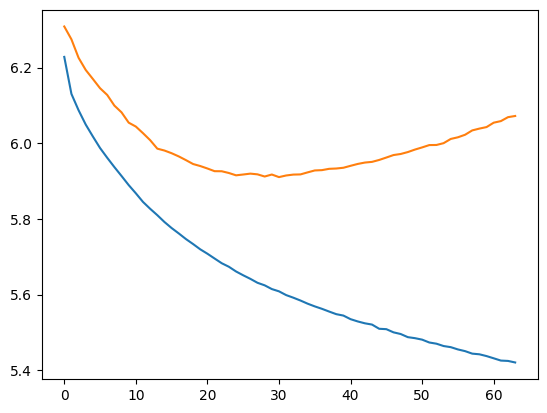

In [152]:
plt.plot(range(config.EPOCHS), training.history["loss"])
plt.plot(range(config.EPOCHS), training.history["val_loss"])

In [154]:
model.evaluate(X_test, y_test)

368/368 [==============================] - 3s 3ms/step - loss: 6.0946 - acc: 0.1395


[6.094615936279297, 0.13945375382900238]

In [155]:
def vectorized_words(words):
    vector = np.array([])

    for word in words:
        vector = np.append(vector, word2vec.wv.get_vector(word))

    return vector

In [157]:
custom_test = vectorized_words("the story about".split())

In [164]:
model.save('models/first_model.h5')

In [163]:
model.predict(custom_test)

ValueError: in user code:

    File "c:\Users\jjasi\anaconda3\envs\nlp\lib\site-packages\keras\engine\training.py", line 2137, in predict_function  *
        return step_function(self, iterator)
    File "c:\Users\jjasi\anaconda3\envs\nlp\lib\site-packages\keras\engine\training.py", line 2123, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\jjasi\anaconda3\envs\nlp\lib\site-packages\keras\engine\training.py", line 2111, in run_step  **
        outputs = model.predict_step(data)
    File "c:\Users\jjasi\anaconda3\envs\nlp\lib\site-packages\keras\engine\training.py", line 2079, in predict_step
        return self(x, training=False)
    File "c:\Users\jjasi\anaconda3\envs\nlp\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\Users\jjasi\anaconda3\envs\nlp\lib\site-packages\keras\engine\input_spec.py", line 250, in assert_input_compatibility
        raise ValueError(

    ValueError: Exception encountered when calling layer 'sequential' (type Sequential).
    
    Input 0 of layer "dense" is incompatible with the layer: expected min_ndim=2, found ndim=1. Full shape received: (None,)
    
    Call arguments received by layer 'sequential' (type Sequential):
      • inputs=tf.Tensor(shape=(None,), dtype=float32)
      • training=False
      • mask=None
